In [1]:
import numpy as np
import pandas as pd
import scipy as sc

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, make_scorer
from sklearn.model_selection import RandomizedSearchCV

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 10000)

In [99]:
data = pd.read_table('data.csv', sep=';')

In [100]:
data.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SaleCategory
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,1
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,0
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,1
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,0
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,1


In [4]:
data.shape

(1460, 81)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

/Users/k.gusev/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/Users/k.gusev/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:448: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
/Users/k.gusev/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:448: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
/Users/k.gusev/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered 

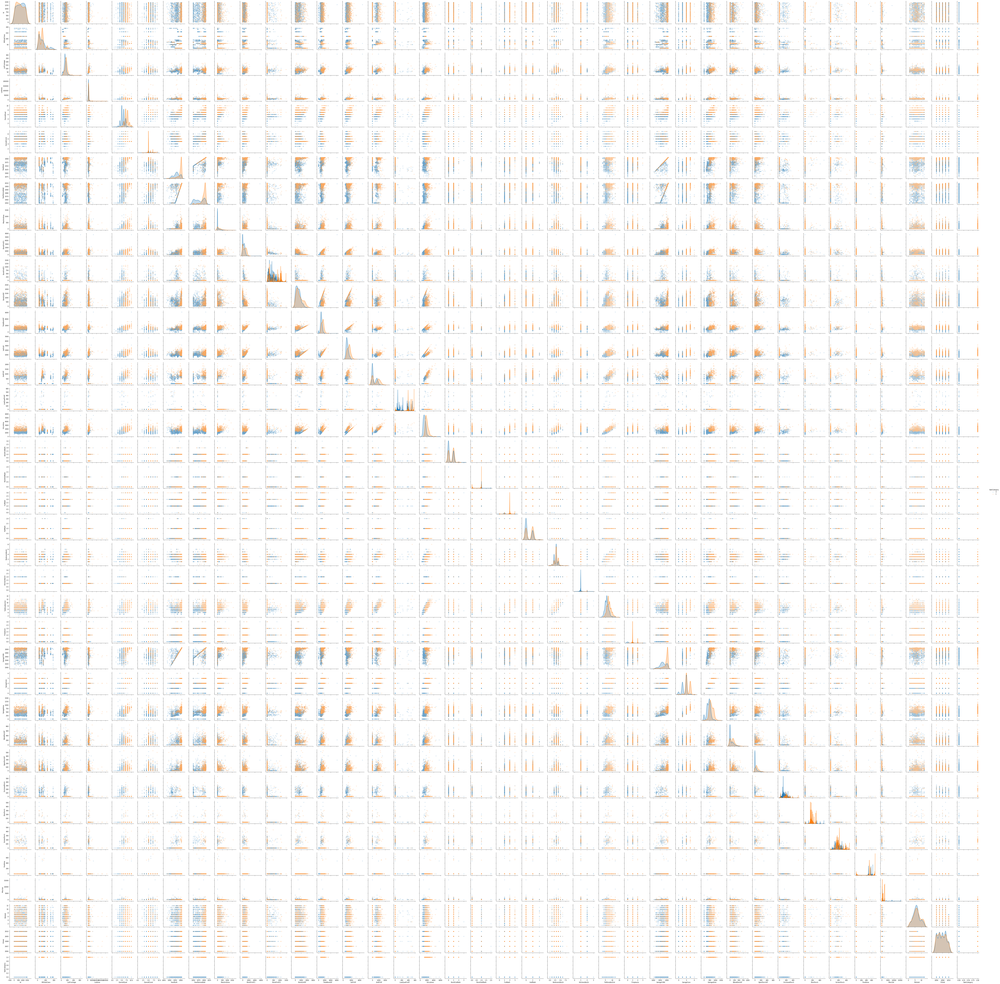

In [6]:
#graph = sns.pairplot(data=data ,plot_kws={'alpha':0.2},hue='SaleCategory')

In [7]:
#graph.savefig("lab.png")

In [8]:
all_data_na = (data.isnull().sum() / len(data)) * 100
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)
missing_data = pd.DataFrame({'Missing Ratio' :all_data_na})
missing_data.head(30)

,Missing Ratio
PoolQC,99.520548
MiscFeature,96.301370
Alley,93.767123
Fence,80.753425
FireplaceQu,47.260274
LotFrontage,17.739726
GarageYrBlt,5.547945
GarageType,5.547945
GarageFinish,5.547945
GarageQual,5.547945


### preprocessing

In [101]:
def get_one_hot(df, cols):
    """
    @param df pandas DataFrame
    @param cols a list of columns to encode 
    @return a DataFrame with one-hot encoding
    """
    for each in cols:
        dummies = pd.get_dummies(df[each], prefix=each, drop_first=False)
        df = pd.concat([df, dummies], axis=1)
    return df

##### преобразование порядковых категориальных

In [102]:
exter_dict_name = ["ExterQual", "ExterCond", "BsmtQual", "BsmtCond", "KitchenQual",\
                   "FireplaceQu", "GarageQual", "GarageCond", "PoolQC"]

In [103]:
exter_dict = { "ExterQual": {"Ex":5, "Gd":4, "TA":3, "Fa":2, "Po":1},
                "ExterCond": {"Ex":5, "Gd":4, "TA":3, "Fa":2, "Po":1},
                "BsmtQual": {"Ex":6, "Gd":5, "TA":4, "Fa":3, "Po":2, "NA":0},
                "BsmtCond": {"Gd":5, "TA":4, "Fa":3, "Po":2, "NA":0},
                "KitchenQual": {"Ex":5, "Gd":4, "TA":3, "Fa":2, "Po":1},
                "FireplaceQu": {"Ex":6, "Gd":5, "TA":4, "Fa":3, "Po":2, "NA":0},
                "GarageQual": {"Ex":6, "Gd":5, "TA":4, "Fa":3, "Po":2, "NA":0},
                "GarageCond": {"Ex":6, "Gd":5, "TA":4, "Fa":3, "Po":2, "NA":0},
                "PoolQC": {"Ex":6, "Gd":5, "TA":4, "Fa":3, "NA":0}}

In [104]:
data.replace(exter_dict, inplace=True)

data[exter_dict_name] = data[exter_dict_name].fillna(0)

#преобразование в тип int
for col in exter_dict_name:
    data[col].apply(lambda x: int(x))

#### разделение на категориальные/непрерывные

In [105]:
cat_columns = data.select_dtypes(include='object', exclude=['int64', 'float64']).columns
cat_coll = list(cat_columns)
all_coll = list(data.columns)

In [176]:
cat_columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'Foundation', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir',
       'Electrical', 'Functional', 'GarageType', 'GarageFinish', 'PavedDrive',
       'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'],
      dtype='object')

In [107]:
num_columns = list(set(all_coll) - set(cat_coll))

##### заполняем нули

In [108]:
# Видел в работе, что не важная переменная
data.groupby(['YrSold']).count()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,SaleType,SaleCondition,SaleCategory
YrSold,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2006,314,314,314,265,314,314,19,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,313,313,314,314,314,314,314,305,306,314,306,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,299,299,299,314,314,314,314,314,314,314,314,314,314,314,314,52,8,314,314,314,314,314
2007,329,329,329,266,329,329,19,329,329,329,329,329,329,329,329,329,329,329,329,329,329,329,329,329,329,327,327,329,329,329,329,329,324,324,329,324,329,329,329,329,329,329,329,329,329,329,329,329,329,329,329,329,329,329,329,329,329,329,312,312,312,329,329,329,329,329,329,329,329,329,329,329,329,64,12,329,329,329,329,329
2008,304,304,304,254,304,304,27,304,304,304,304,304,304,304,304,304,304,304,304,304,304,304,304,304,304,301,301,304,304,304,304,304,298,298,304,298,304,304,304,304,304,304,303,304,304,304,304,304,304,304,304,304,304,304,304,304,304,304,281,281,281,304,304,304,304,304,304,304,304,304,304,304,304,58,9,304,304,304,304,304
2009,338,338,338,273,338,338,20,338,338,338,338,338,338,338,338,338,338,338,338,338,338,338,338,338,338,337,337,338,338,338,338,338,325,325,338,324,338,338,338,338,338,338,338,338,338,338,338,338,338,338,338,338,338,338,338,338,338,338,323,323,323,338,338,338,338,338,338,338,338,338,338,338,338,67,11,338,338,338,338,338
2010,175,175,175,143,175,175,6,175,175,175,175,175,175,175,175,175,175,175,175,175,175,175,175,175,175,174,174,175,175,175,175,175,170,170,175,170,175,175,175,175,175,175,175,175,175,175,175,175,175,175,175,175,175,175,175,175,175,175,164,164,164,175,175,175,175,175,175,175,175,175,175,175,175,40,14,175,175,175,175,175


In [109]:
data['Electrical'] = data['Electrical'].fillna(data['Electrical'].mode()[0])

In [110]:
#Mode (most common value) of discrete data
data['Electrical'].mode()

0    SBrkr
dtype: object

In [111]:
data.groupby('Electrical').count()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SaleCategory
Electrical,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
FuseA,94,94,94,80,94,94,12,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,88,88,94,88,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,94,81,81,81,94,94,94,94,94,94,94,94,94,94,94,94,23,2,94,94,94,94,94,94
FuseF,27,27,27,25,27,27,4,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,21,21,27,21,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,22,22,22,27,27,27,27,27,27,27,27,27,27,27,27,2,0,27,27,27,27,27,27
FuseP,3,3,3,3,3,3,2,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,2,2,3,2,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,2,2,2,3,3,3,3,3,3,3,3,3,3,3,3,0,0,3,3,3,3,3,3
Mix,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1
SBrkr,1335,1335,1335,1092,1335,1335,73,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1327,1327,1335,1335,1335,1335,1335,1310,1311,1335,1310,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1273,1273,1273,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,1335,256,52,1335,1335,1335,1335,1335,1335


In [112]:
#Group by neighborhood and fill in missing value by the median LotFrontage of all the neighborhood
# +
data["LotFrontage"] = data.groupby(['Street', 'Neighborhood'])["LotFrontage"].transform(
    lambda x: x.fillna(x.median()))

In [113]:
# fill category null
cat_data = data[cat_columns].fillna('null_indicator')
num_data = data[num_columns].fillna(-9999)

In [159]:
pre_data = cat_data.join(num_data)

In [160]:
#category to binary
pre_data = get_one_hot(pre_data, cat_columns)
pre_data = pre_data.drop(cat_columns, axis = 1)

pre_data.shape

(1460, 269)

### feature selection

In [116]:
bin_columns = list(set(pre_data.columns) - set(cat_coll)-set(num_data))

In [117]:
exbin_columns = list(set(pre_data.columns) - set(bin_columns))

In [118]:
high_corr = pre_data[exbin_columns].corr(method ='pearson')[(abs(pre_data[exbin_columns].corr(method ='pearson'))>=0.2)]\
.dropna(axis=1, how='all')['SaleCategory'].dropna()

In [119]:
high_corr_col = list(high_corr.index)
len(high_corr_col)

23

In [168]:
all_corr_col = []

for col in set(pre_data.columns):
    if abs(sc.stats.pointbiserialr(pre_data['SaleCategory'], pre_data[col])[0]) >=0.2:
        all_corr_col.append(col)

In [169]:
pre_data = pre_data[all_corr_col]

In [170]:
pre_data.shape

(1460, 47)

In [177]:
pre_data.head()

,Fireplaces,BsmtQual,Foundation_PConc,Neighborhood_NridgHt,HouseStyle_2Story,Foundation_CBlock,YearRemodAdd,MSZoning_RM,GrLivArea,TotalBsmtSF,1stFlrSF,BsmtFinSF1,HeatingQC_Ex,BsmtExposure_No,FullBath,SaleCategory,GarageFinish_Fin,HeatingQC_TA,MasVnrType_Stone,FireplaceQu,WoodDeckSF,GarageCars,Neighborhood_NoRidge,SaleType_New,LotShape_IR1,OverallQual,LotArea,GarageFinish_Unf,TotRmsAbvGrd,Neighborhood_NAmes,LotShape_Reg,KitchenQual,GarageArea,YearBuilt,2ndFlrSF,GarageType_Attchd,LotFrontage,OpenPorchSF,BsmtExposure_Gd,SaleCondition_Partial,ExterQual,GarageType_Detchd,BsmtFinType1_GLQ,MasVnrType_None,Exterior1st_VinylSd,BsmtUnfSF,Exterior2nd_VinylSd
0,0,5.0,1,0,1,0,2003,0,1710,856,856,706,1,1,2,1,0,0,0,0.0,0,2,0,0,0,7,8450,0,8,0,1,4,548,2003,854,1,65.0,61,0,0,4,0,1,0,1,150,1
1,1,5.0,0,0,0,1,1976,0,1262,1262,1262,978,1,0,2,0,0,0,0,4.0,298,2,0,0,0,6,9600,0,6,0,1,3,460,1976,0,1,80.0,0,1,0,3,0,0,1,0,284,0
2,1,5.0,1,0,1,0,2002,0,1786,920,920,486,1,0,2,1,0,0,0,4.0,0,2,0,0,1,7,11250,0,6,0,0,4,608,2001,866,1,68.0,42,0,0,4,0,1,0,1,434,1
3,1,4.0,0,0,1,0,1970,0,1717,756,961,216,0,1,1,0,0,0,0,5.0,0,3,0,0,1,7,9550,1,7,0,0,4,642,1915,756,0,60.0,35,0,0,3,1,0,1,0,540,0
4,1,5.0,1,0,1,0,2000,0,2198,1145,1145,655,1,0,2,1,0,0,0,4.0,192,3,1,0,1,8,14260,0,9,0,0,4,836,2000,1053,1,84.0,84,0,0,4,0,1,0,1,490,1


https://habr.com/ru/post/264915/

### train test split

In [124]:
pre_data = pre_data.drop('Id', axis = 1)

KeyError: "['Id'] not found in axis"

In [171]:
X_train, X_test, y_train, y_test = train_test_split(pre_data.drop('SaleCategory', axis = 1), pre_data['SaleCategory'],\
                                                          test_size=0.3, shuffle=True, random_state=42)

In [172]:
clf = RandomForestClassifier(n_estimators=50,random_state=0).fit(X_train, y_train) 
prediction_train = clf.predict(X_train)
prediction_test = clf.predict(X_test)

In [173]:
roc_auc_score(y_train, prediction_train)

1.0

In [174]:
roc_auc_score(y_test, prediction_test)

0.9128178913738019

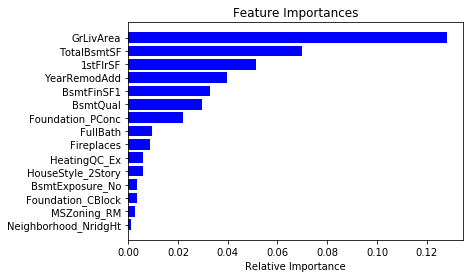

In [175]:
features = X_train.columns
importances = clf.feature_importances_[0:15]

indices = np.argsort(importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [38]:
importances_p = clf.feature_importances_[0:30]
indices_p = np.argsort(importances_p)

In [39]:
X_train.iloc[:,indices_p].shape

(1022, 30)

In [40]:
clf = RandomForestClassifier(n_estimators=30, random_state=0).fit(X_train.iloc[:,indices_p], y_train) 
prediction_train = clf.predict(X_train.iloc[:,indices_p])
prediction_test = clf.predict(X_test.iloc[:,indices_p])

In [41]:
roc_auc_score(y_train, prediction_train)

1.0

In [42]:
roc_auc_score(y_test, prediction_test)

0.8784281150159744

In [43]:
rfc_params = {
'n_estimators':[1, 3, 10, 30, 50, 100, 150, 300],
'max_features': [1, 2, 3, 4, 5, 7, 10, None],
'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
'min_samples_split': [3,5,7,9,13],
'min_samples_leaf': [3,5,7,9,13]
}

rfc = RandomForestClassifier(n_jobs=10)

In [44]:
rfc_rs = RandomizedSearchCV(rfc,rfc_params,n_iter=100, cv = 5, n_jobs=5,verbose=3,scoring=make_scorer(roc_auc_score))

In [45]:
rfc_rs.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  22 tasks      | elapsed:    4.0s
[Parallel(n_jobs=5)]: Done 118 tasks      | elapsed:   12.4s
[Parallel(n_jobs=5)]: Done 278 tasks      | elapsed:   24.7s
[Parallel(n_jobs=5)]: Done 500 out of 500 | elapsed:   40.1s finished


RandomizedSearchCV(cv=5, error_score='raise-deprecating',
          estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=10,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
          fit_params=None, iid='warn', n_iter=100, n_jobs=5,
          param_distributions={'n_estimators': [1, 3, 10, 30, 50, 100, 150, 300], 'max_features': [1, 2, 3, 4, 5, 7, 10, None], 'max_depth': [3, 4, 5, 6, 7, 8, 9, 10], 'min_samples_split': [3, 5, 7, 9, 13], 'min_samples_leaf': [3, 5, 7, 9, 13]},
          pre_dispatch='2*n_jobs', random_state=None, refit=True,
          return_train_score='warn', scoring=make_scorer(roc_auc_score),
          verbose=3)

In [46]:
rfc_rs.best_score_

0.8892702493960951

In [47]:
rfc_rs.best_params_

{'n_estimators': 100,
 'min_samples_split': 3,
 'min_samples_leaf': 7,
 'max_features': None,
 'max_depth': 7}

In [48]:
rfc_rs.cv_results_

/Users/k.gusev/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/Users/k.gusev/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/Users/k.gusev/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:125: FutureWarning: You are accessing a training score ('split2_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/Users/k.gusev/anaconda3/

{'mean_fit_time': array([0.50642715, 0.11398602, 0.12080245, 0.14906192, 0.25337396,
        0.11144199, 1.23259306, 0.12365885, 0.1199698 , 0.12191405,
        0.13903422, 0.10862479, 0.41243963, 0.37473264, 0.11325364,
        0.13693037, 0.39104986, 0.13697681, 0.10981107, 0.11691952,
        0.11832871, 0.14916272, 0.1080781 , 0.12577877, 0.11546898,
        0.12676754, 0.43103023, 0.40218015, 0.10879207, 0.11537724,
        0.11603231, 0.40939212, 0.1104568 , 0.11090598, 0.1126709 ,
        0.1121769 , 0.13851085, 0.11060596, 0.11905613, 0.19443521,
        0.12276187, 0.1113956 , 0.23887358, 0.11750307, 0.40750799,
        0.14062243, 0.10964975, 0.44395509, 0.11366401, 0.41228437,
        0.10847788, 0.1083467 , 0.14913979, 0.10880699, 0.10741305,
        0.14075489, 0.11477776, 0.11467004, 0.13575006, 0.40731111,
        0.14315076, 0.10818396, 0.1203639 , 0.271491  , 0.10967441,
        0.13393364, 0.10659084, 0.13784895, 0.10905929, 0.10839419,
        0.10758142, 0.40587831,

In [49]:
def GridSearch_table_plot(grid_clf, param_name,
                          num_results=15,
                          negative=True,
                          graph=True,
                          display_all_params=True):

    '''Display grid search results

    Arguments
    ---------

    grid_clf           the estimator resulting from a grid search
                       for example: grid_clf = GridSearchCV( ...

    param_name         a string with the name of the parameter being tested

    num_results        an integer indicating the number of results to display
                       Default: 15

    negative           boolean: should the sign of the score be reversed?
                       scoring = 'neg_log_loss', for instance
                       Default: True

    graph              boolean: should a graph be produced?
                       non-numeric parameters (True/False, None) don't graph well
                       Default: True

    display_all_params boolean: should we print out all of the parameters, not just the ones searched for?
                       Default: True

    Usage
    -----

    GridSearch_table_plot(grid_clf, "min_samples_leaf")

                          '''
    from matplotlib      import pyplot as plt
    from IPython.display import display
    import pandas as pd

    clf = grid_clf.best_estimator_
    clf_params = grid_clf.best_params_
    if negative:
        clf_score = -grid_clf.best_score_
    else:
        clf_score = grid_clf.best_score_
    clf_stdev = grid_clf.cv_results_['std_test_score'][grid_clf.best_index_]
    cv_results = grid_clf.cv_results_

    print("best parameters: {}".format(clf_params))
    print("best score:      {:0.5f} (+/-{:0.5f})".format(clf_score, clf_stdev))
    if display_all_params:
        import pprint
        pprint.pprint(clf.get_params())

    # pick out the best results
    # =========================
    scores_df = pd.DataFrame(cv_results).sort_values(by='rank_test_score')

    best_row = scores_df.iloc[0, :]
    if negative:
        best_mean = -best_row['mean_test_score']
    else:
        best_mean = best_row['mean_test_score']
    best_stdev = best_row['std_test_score']
    best_param = best_row['param_' + param_name]

    # display the top 'num_results' results
    # =====================================
    display(pd.DataFrame(cv_results) \
            .sort_values(by='rank_test_score').head(num_results))

    # plot the results
    # ================
    scores_df = scores_df.sort_values(by='param_' + param_name)

    if negative:
        means = -scores_df['mean_test_score']
    else:
        means = scores_df['mean_test_score']
    stds = scores_df['std_test_score']
    params = scores_df['param_' + param_name]

    # plot
    if graph:
        plt.figure(figsize=(8, 8))
        plt.errorbar(params, means, yerr=stds)

        plt.axhline(y=best_mean + best_stdev, color='red')
        plt.axhline(y=best_mean - best_stdev, color='red')
        plt.plot(best_param, best_mean, 'or')

        plt.title(param_name + " vs Score\nBest Score {:0.5f}".format(clf_score))
        plt.xlabel(param_name)
        plt.ylabel('Score')
        plt.show()

best parameters: {'n_estimators': 100, 'min_samples_split': 3, 'min_samples_leaf': 7, 'max_features': None, 'max_depth': 7}
best score:      0.88927 (+/-0.03098)
{'bootstrap': True,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 7,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 7,
 'min_samples_split': 3,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': 10,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
63,0.271491,0.079451,0.114984,0.013523,100,3,7,None,7,"{'n_estimators': 100, 'min_samples_split': 3, ...",0.865836,0.915576,0.880055,0.850863,0.934007,0.889270,0.030982,1,0.947116,0.950011,0.932760,0.935038,0.945119,0.942009,0.006840
13,0.374733,0.100768,0.121154,0.017354,150,5,9,None,5,"{'n_estimators': 150, 'min_samples_split': 5, ...",0.861268,0.915576,0.876533,0.858928,0.925943,0.887651,0.027894,2,0.939311,0.931505,0.928636,0.927497,0.938455,0.933081,0.004922
6,1.232593,0.053333,0.108028,0.006148,300,9,5,None,9,"{'n_estimators': 300, 'min_samples_split': 9, ...",0.857771,0.920144,0.868469,0.862449,0.917878,0.885349,0.027716,3,0.963866,0.967639,0.944334,0.953537,0.965896,0.959054,0.008841
14,0.113254,0.004914,0.109142,0.007551,3,13,7,None,4,"{'n_estimators': 3, 'min_samples_split': 13, '...",0.865836,0.877397,0.846320,0.892208,0.926965,0.881725,0.027112,4,0.930421,0.906071,0.915832,0.928622,0.907322,0.917653,0.010272
33,0.110906,0.002347,0.105404,0.001330,10,13,3,None,8,"{'n_estimators': 10, 'min_samples_split': 13, ...",0.868261,0.891101,0.871990,0.846320,0.922422,0.880018,0.025511,5,0.955181,0.959575,0.939686,0.958708,0.945996,0.951829,0.007746
97,0.110701,0.003001,0.106522,0.001809,10,13,7,None,7,"{'n_estimators': 10, 'min_samples_split': 13, ...",0.853203,0.888958,0.884598,0.863471,0.909814,0.879991,0.019907,6,0.943860,0.945100,0.927851,0.946873,0.924958,0.937728,0.009341
23,0.125779,0.004209,0.105969,0.001606,50,5,3,None,4,"{'n_estimators': 50, 'min_samples_split': 5, '...",0.853203,0.892454,0.864948,0.874035,0.914357,0.879786,0.021519,7,0.948254,0.941327,0.932053,0.933284,0.936962,0.938376,0.005902
76,0.109586,0.001748,0.104996,0.001623,10,7,13,None,8,"{'n_estimators': 10, 'min_samples_split': 7, '...",0.846210,0.895951,0.856883,0.857905,0.906293,0.872645,0.023834,8,0.913877,0.911085,0.910753,0.908121,0.908737,0.910514,0.002029
83,0.109392,0.001705,0.104836,0.001461,10,3,13,None,9,"{'n_estimators': 10, 'min_samples_split': 3, '...",0.842714,0.907512,0.836211,0.853362,0.913335,0.870635,0.033003,9,0.902039,0.915634,0.894624,0.901811,0.900934,0.903008,0.006876
70,0.107581,0.001654,0.105562,0.001111,3,5,3,None,9,"{'n_estimators': 3, 'min_samples_split': 5, 'm...",0.843785,0.851568,0.870513,0.847342,0.910836,0.864775,0.024781,10,0.960868,0.955440,0.942579,0.964757,0.945996,0.953928,0.008478


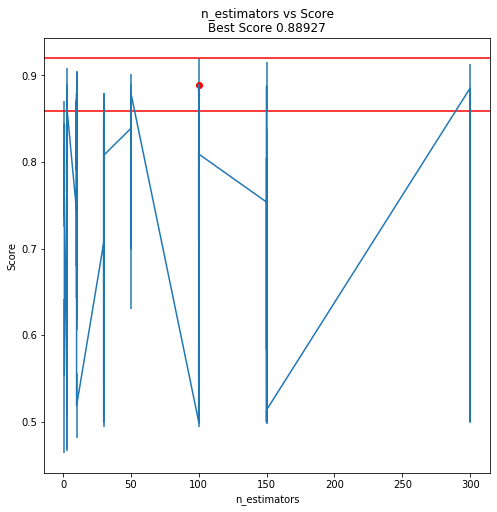

In [50]:
GridSearch_table_plot(rfc_rs, 'n_estimators', negative=False)